## Initial setup

In [ ]:
#@title Install the required libs
!pip install -qq diffusers==0.4.1 transformers ftfy
!pip install -qq "ipywidgets>=7,<8"

In [ ]:
title Login to the Hugging Face Hub
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
import os
import torch

import PIL
from PIL import Image

from diffusers import StableDiffusionPipeline
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Run Stable Diffusion with pre-trained Learned Concepts



In [ ]:
#@markdown `pretrained_model_name_or_path` which Stable Diffusion checkpoint you want to use. This should match the one used for training the embeddings.
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4" #@param {type:"string"}

In [ ]:
from IPython.display import Markdown
from huggingface_hub import hf_hub_download
#@title Load your concept here
#@markdown Enter the `repo_id` for a concept you like (you can find pre-learned concepts in the public [SD Concepts Library](https://huggingface.co/sd-concepts-library))
repo_id_embeds = "sd-concepts-library/trigger-studio" #@param {type:"string"}


#@markdown (Optional) in case you have a `learned_embeds.bin` file and not a `repo_id`, add the path to `learned_embeds.bin` to the `embeds_url` variable 
embeds_url = "" #Add the URL or path to a learned_embeds.bin file in case you have one
placeholder_token_string = "" #Add what is the token string in case you are uploading your own embed

downloaded_embedding_folder = "./downloaded_embedding"
if not os.path.exists(downloaded_embedding_folder):
  os.mkdir(downloaded_embedding_folder)
if(not embeds_url):
  embeds_path = hf_hub_download(repo_id=repo_id_embeds, filename="learned_embeds.bin")
  token_path = hf_hub_download(repo_id=repo_id_embeds, filename="token_identifier.txt")
  !cp $embeds_path $downloaded_embedding_folder
  !cp $token_path $downloaded_embedding_folder
  with open(f'{downloaded_embedding_folder}/token_identifier.txt', 'r') as file:
    placeholder_token_string = file.read()
else:
  !wget -q -O $downloaded_embedding_folder/learned_embeds.bin $embeds_url

learned_embeds_path = f"{downloaded_embedding_folder}/learned_embeds.bin"

display (Markdown("## The placeholder token for your concept is `%s`"%(placeholder_token_string)))

Downloading:   0%|          | 0.00/3.82k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/16.0 [00:00<?, ?B/s]

## The placeholder token for your concept is `<Trigger Studio>`

In [ ]:
#@title Set up the Tokenizer and the Text Encoder
tokenizer = CLIPTokenizer.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="tokenizer",
)
text_encoder = CLIPTextModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="text_encoder", torch_dtype=torch.float16
)

In [ ]:
#@title Load the newly learned embeddings into CLIP
def load_learned_embed_in_clip(learned_embeds_path, text_encoder, tokenizer, token=None):
  loaded_learned_embeds = torch.load(learned_embeds_path, map_location="cpu")
  
  # separate token and the embeds
  trained_token = list(loaded_learned_embeds.keys())[0]
  embeds = loaded_learned_embeds[trained_token]

  # cast to dtype of text_encoder
  dtype = text_encoder.get_input_embeddings().weight.dtype
  embeds.to(dtype)

  # add the token in tokenizer
  token = token if token is not None else trained_token
  num_added_tokens = tokenizer.add_tokens(token)
  if num_added_tokens == 0:
    raise ValueError(f"The tokenizer already contains the token {token}. Please pass a different `token` that is not already in the tokenizer.")
  
  # resize the token embeddings
  text_encoder.resize_token_embeddings(len(tokenizer))
  
  # get the id for the token and assign the embeds
  token_id = tokenizer.convert_tokens_to_ids(token)
  text_encoder.get_input_embeddings().weight.data[token_id] = embeds
load_learned_embed_in_clip(learned_embeds_path, text_encoder, tokenizer)

In [ ]:
#@title Img2ImgPipeline
from diffusers import StableDiffusionImg2ImgPipeline

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    pretrained_model_name_or_path,
    revision="fp16",
    torch_dtype=torch.float16,
    text_encoder=text_encoder,
    tokenizer=tokenizer,
).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

#torch

In [ ]:
from torch import autocast
generator = torch.Generator(device="cuda").manual_seed(1024)
from torch import autocast
generator = torch.Generator(device="cuda").manual_seed(1)

#trigger-studio https://huggingface.co/sd-concepts-library/trigger-studio

In [ ]:
import requests
from io import BytesIO
from PIL import Image

url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((600, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

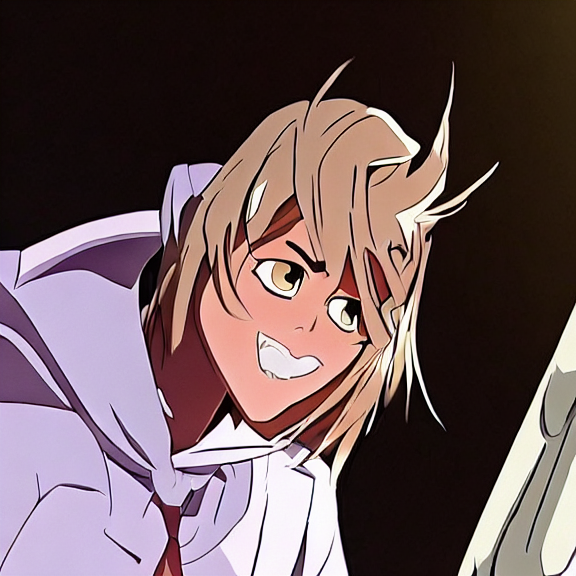

In [ ]:
prompt = "a man in a pink sweatshirt poses for a photo in  \u003CTrigger Studio>" #@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

In [ ]:
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((500, 600))
init_img

  0%|          | 0/46 [00:00<?, ?it/s]

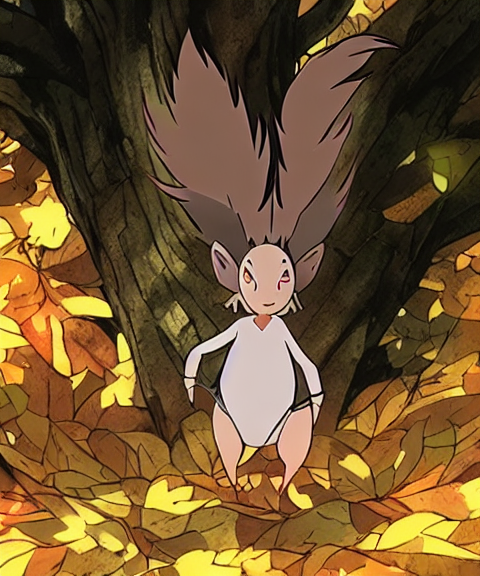

In [ ]:
prompt = "a squirrel standing on top of leaves in \u003CTrigger Studio>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.9, guidance_scale=7.5, generator=generator).images[0]
image

In [ ]:
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg" 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((600, 700))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

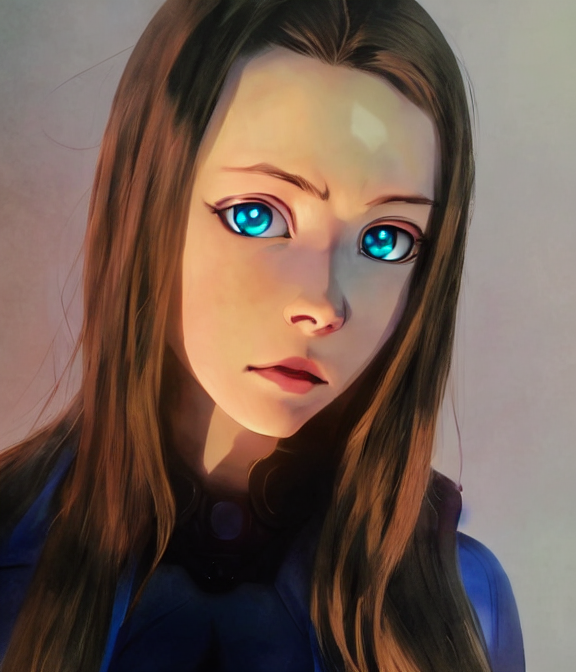

In [ ]:
prompt = "a girl with blue eyes posing for the camera in \u003CTrigger Studio>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image


#portrait-style-dishonored https://huggingface.co/sd-concepts-library/dishonored-portrait-styles

###boy

In [ ]:
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((600, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

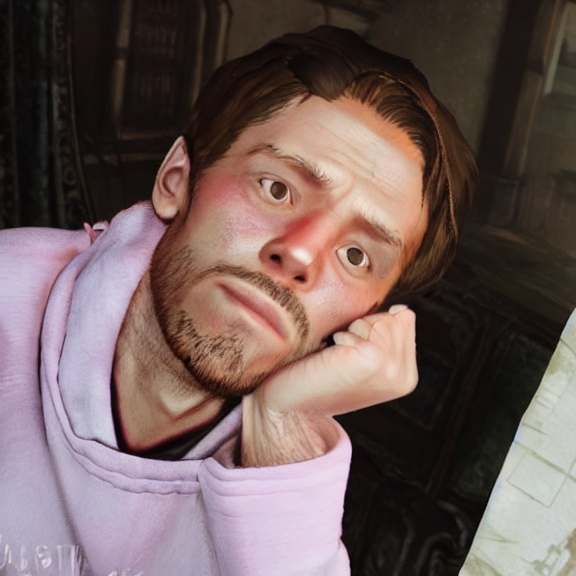

In [ ]:
prompt = "a man in a pink sweatshirt poses for a photo in \u003Cdishonored-portrait-styles>" #@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

###squirrel

In [ ]:
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((500, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

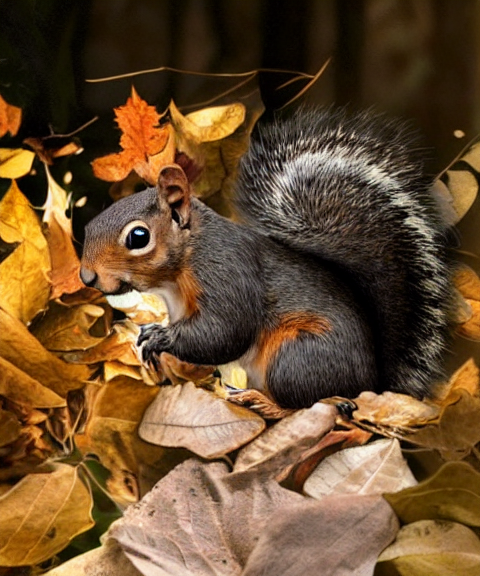

In [ ]:
prompt = "a small brown and black squirrel standing on top of leaves in \u003Cdishonored-portrait-styles>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

###Rita

In [ ]:
url = 'http://almode.ru/uploads/posts/2021-03/1617026432_44-p-rita-ora-44.jpg' 
response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((500, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

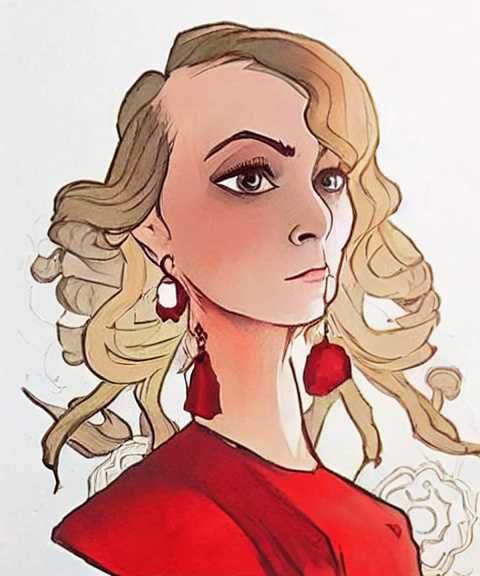

In [ ]:
prompt = "the woman is wearing a red dress and earrings in \u003Cdishonored-portrait-styles>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

###girl

In [ ]:
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg" 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((500, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

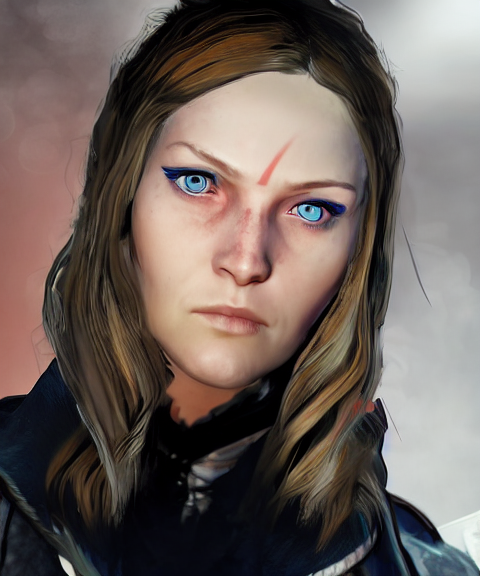

In [ ]:
prompt = "a girl with blue eyes posing for the camera in \u003Cdishonored-portrait-styles>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

#depthmap https://huggingface.co/sd-concepts-library/depthmap

##boy

In [ ]:
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((600, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

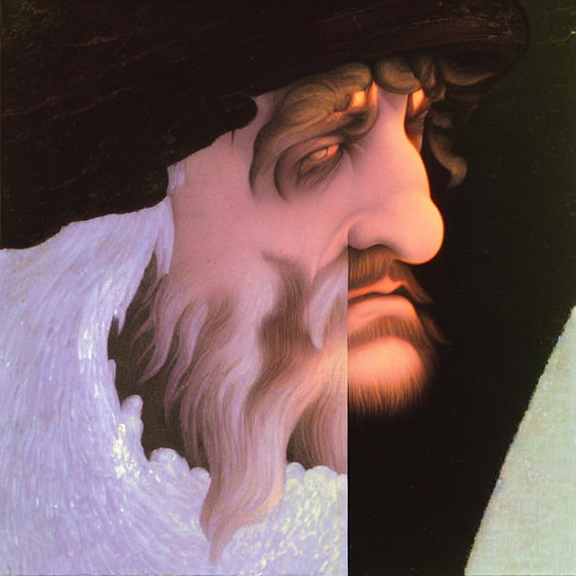

In [ ]:
prompt = "a man in the style of \u003Cdepthmap>" #@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

##squirrel

In [ ]:
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((500, 600))
init_img

  0%|          | 0/46 [00:00<?, ?it/s]

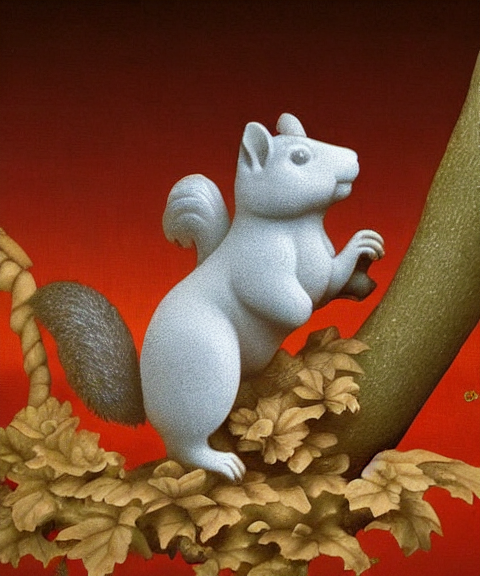

In [ ]:
prompt = "a small squirrel in the style of \u003Cdepthmap>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img,  strength=0.9, guidance_scale=7.5, generator=generator).images[0]
image

#Midjourney style https://huggingface.co/sd-concepts-library/midjourney-style

##boy

In [ ]:
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((600, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

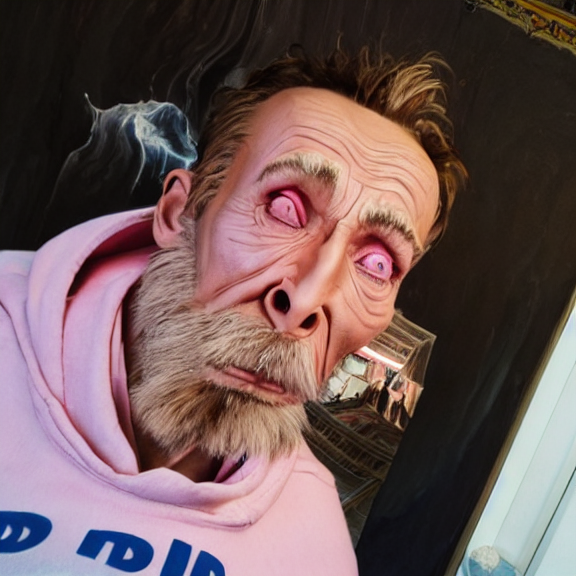

In [ ]:
prompt = "a man in a pink sweatshirt poses for a photo in \u003Cmidjourney-style>" #@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

##squirrel

In [ ]:
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((500, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

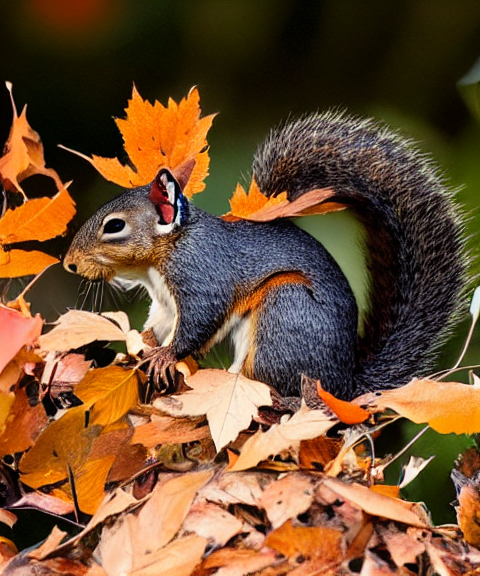

In [ ]:
prompt = "a small brown and black squirrel standing on top of leaves in \u003Cmidjourney-style>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

## girl

In [ ]:
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg" 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((600, 700))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

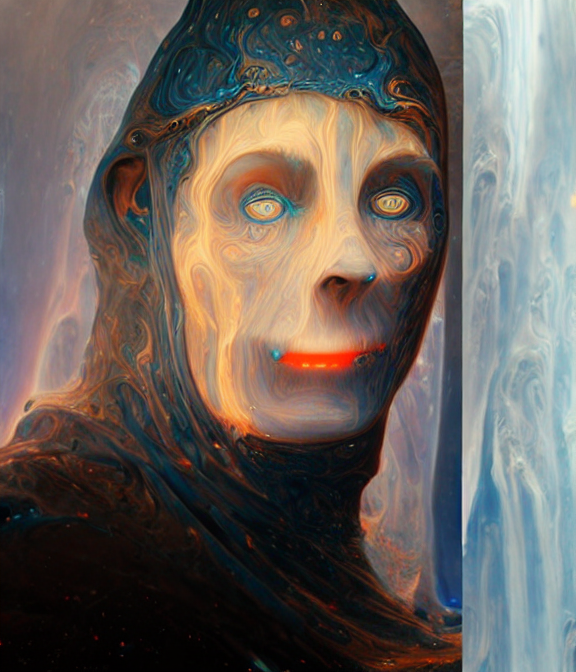

In [ ]:
prompt = "a girl with blue eyes posing for the camera in \u003Cmidjourney-style>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

# Hitokomoru-style <hitokomoru-style> https://huggingface.co/sd-concepts-library/hitokomoru-style-nao

In [ ]:
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((512, 512))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

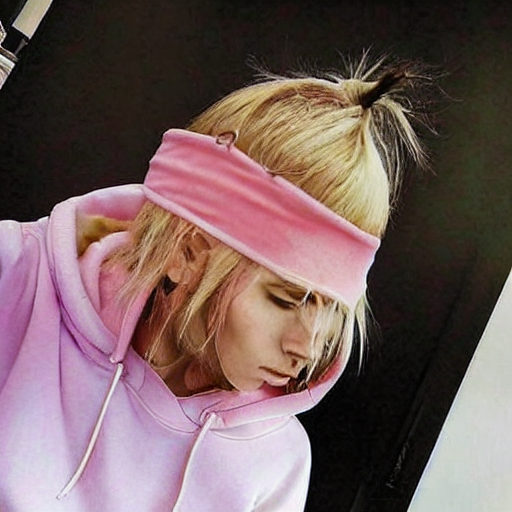

In [ ]:
prompt = "a man in a pink sweatshirt \u003Chitokomoru-style>" #@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

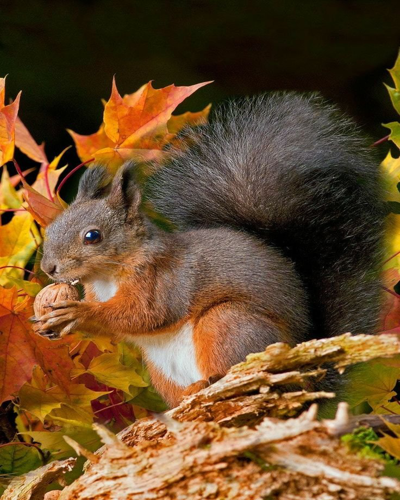

In [ ]:
import requests
from io import BytesIO
from PIL import Image

url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((400, 500))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

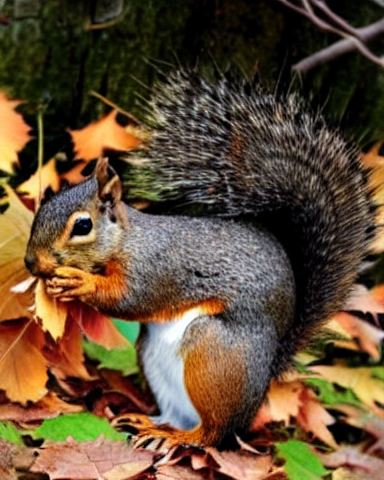

In [ ]:
prompt = "a small brown and black squirrel standing on top of leaves in \u003Chitokomoru-style>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

In [ ]:
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg" 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((600, 700))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

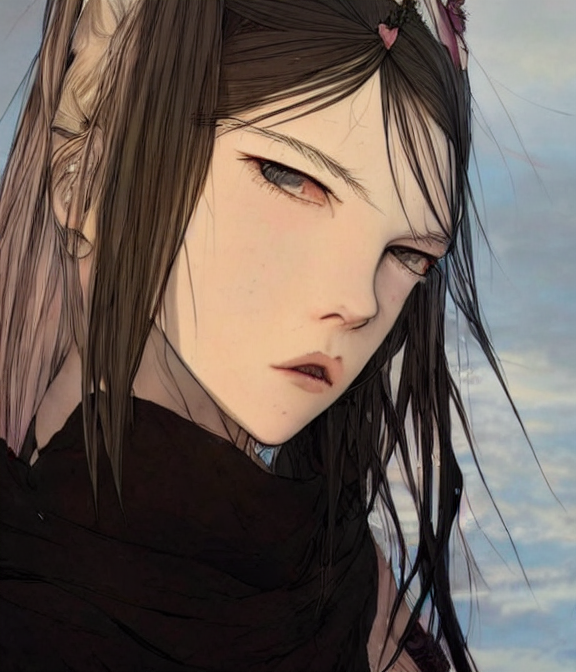

In [ ]:
prompt = "a girl with blue eyes posing for the camera in \u003Chitokomoru-style>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

#Style-of-marc-allante https://huggingface.co/sd-concepts-library/style-of-marc-allante

In [ ]:
url = "https://photo4.wambacdn.net/53/65/48/1789845635/2087452458_square_large.jpg?hash=MEgZxK_qtzG9dh7fIikNcw&expires=64060578000&updated=1631104442"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((512, 512))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

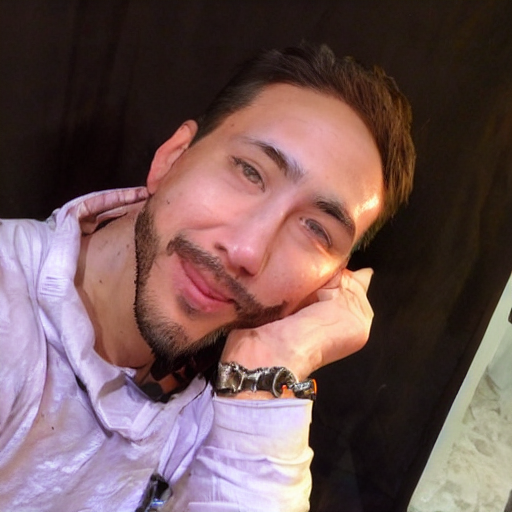

In [ ]:
prompt = "\u003CMarc_Allante>" #@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

In [ ]:
url = 'https://krot.info/uploads/posts/2021-11/1637844096_120-krot-info-p-osennie-zhivotnie-priroda-krasivo-foto-130.jpg' 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((400, 500))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

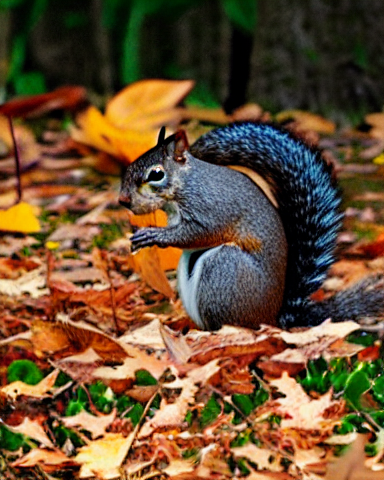

In [ ]:
prompt = "a small brown and black squirrel standing on top of leaves in \u003CMarc_Allante>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image

In [ ]:
url = "https://www.cossa.ru/upload/main/11f/7e351f4fa8ffeded73c357a74e36ae1e_5435633.jpg" 

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((500, 600))
init_img

  0%|          | 0/36 [00:00<?, ?it/s]

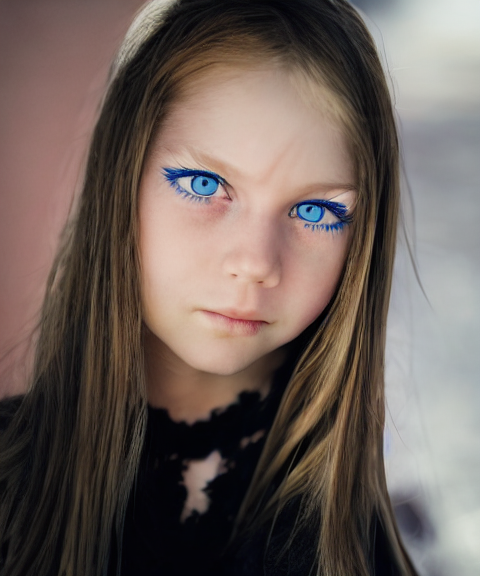

In [ ]:
prompt = "a girl with blue eyes posing for the camera in \u003CMarc_Allante>"#@param {type:"string"}
with autocast("cuda"):
    image = pipe(prompt=prompt, init_image=init_img, strength=0.7, guidance_scale=7.5, generator=generator).images[0]
image